#Preprocessing

###Importing dataset

In [ ]:
#importing necessary libraries
import pandas as pd
import numpy as np
life_expectancy= pd.read_csv("/content/drive/MyDrive/dataset/Life Expectancy Data.csv")
life_expectancy

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,Zimbabwe,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,...,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,Zimbabwe,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,...,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,Zimbabwe,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,...,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,Zimbabwe,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,...,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


###Sanity check

In [ ]:
#shape
life_expectancy.shape

(2938, 22)

In [ ]:
#info
life_expectancy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [ ]:
#finding missing values
life_expectancy.isnull().sum()

,0
Country,0
Year,0
Status,0
Life expectancy,10
Adult Mortality,10
infant deaths,0
Alcohol,194
percentage expenditure,0
Hepatitis B,553
Measles,0


In [ ]:
#percentage missing values
life_expectancy.isnull().sum()/life_expectancy.shape[0]*100

,0
Country,0.000000
Year,0.000000
Status,0.000000
Life expectancy,0.340368
Adult Mortality,0.340368
infant deaths,0.000000
Alcohol,6.603131
percentage expenditure,0.000000
Hepatitis B,18.822328
Measles,0.000000


In [ ]:
#finding duplicates
life_expectancy.duplicated().sum()

0

In [ ]:
#identifying garbage values
for i in life_expectancy.select_dtypes(include="object").columns:
  print(life_expectancy[i].value_counts())
  print("***"*10)

Country
Afghanistan              16
Peru                     16
Nicaragua                16
Niger                    16
Nigeria                  16
                         ..
Niue                      1
San Marino                1
Nauru                     1
Saint Kitts and Nevis     1
Dominica                  1
Name: count, Length: 193, dtype: int64
******************************
Status
Developing    2426
Developed      512
Name: count, dtype: int64
******************************


###Exploratory Data Analysis

In [ ]:
#importing libraries
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
#describe statistics
life_expectancy.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,2938.0,2.007519e+03,4.613841e+00,2000.00000,2004.000000,2.008000e+03,2.012000e+03,2.015000e+03
Life expectancy,2928.0,6.922493e+01,9.523867e+00,36.30000,63.100000,7.210000e+01,7.570000e+01,8.900000e+01
Adult Mortality,2928.0,1.647964e+02,1.242921e+02,1.00000,74.000000,1.440000e+02,2.280000e+02,7.230000e+02
infant deaths,2938.0,3.030395e+01,1.179265e+02,0.00000,0.000000,3.000000e+00,2.200000e+01,1.800000e+03
Alcohol,2744.0,4.602861e+00,4.052413e+00,0.01000,0.877500,3.755000e+00,7.702500e+00,1.787000e+01
percentage expenditure,2938.0,7.382513e+02,1.987915e+03,0.00000,4.685343,6.491291e+01,4.415341e+02,1.947991e+04
Hepatitis B,2385.0,8.094046e+01,2.507002e+01,1.00000,77.000000,9.200000e+01,9.700000e+01,9.900000e+01
Measles,2938.0,2.419592e+03,1.146727e+04,0.00000,0.000000,1.700000e+01,3.602500e+02,2.121830e+05
BMI,2904.0,3.832125e+01,2.004403e+01,1.00000,19.300000,4.350000e+01,5.620000e+01,8.730000e+01
under-five deaths,2938.0,4.203574e+01,1.604455e+02,0.00000,0.000000,4.000000e+00,2.800000e+01,2.500000e+03


In [ ]:
life_expectancy.describe(include="object").T

,count,unique,top,freq
Country,2938,193,Afghanistan,16
Status,2938,2,Developing,2426


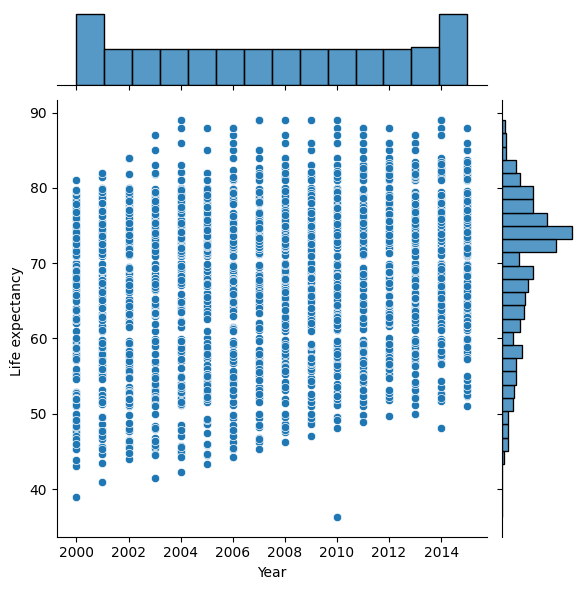

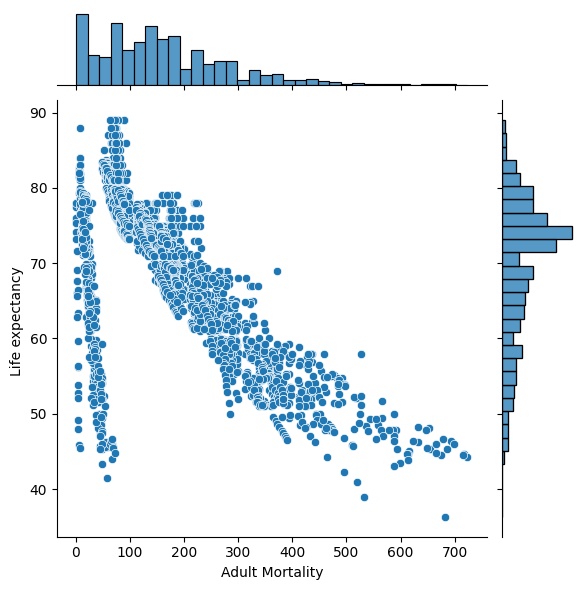

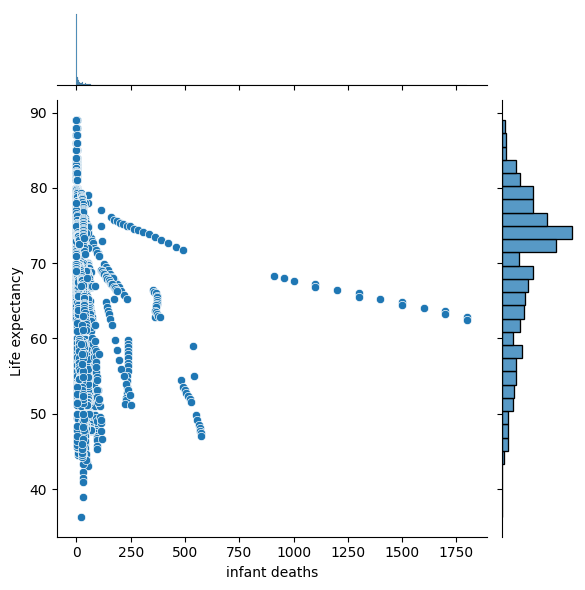

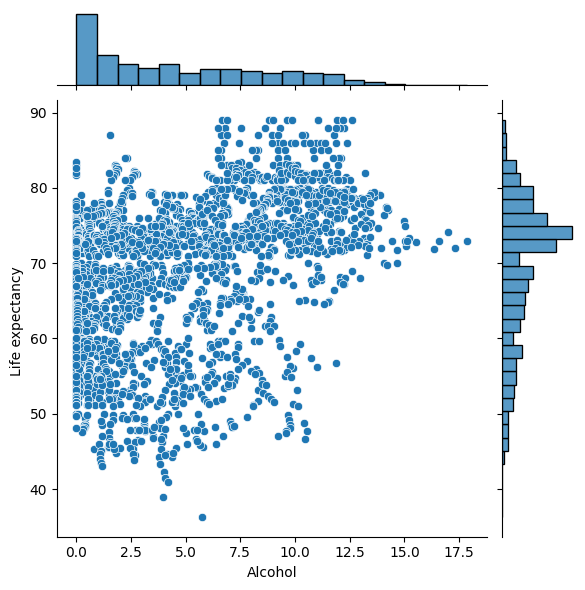

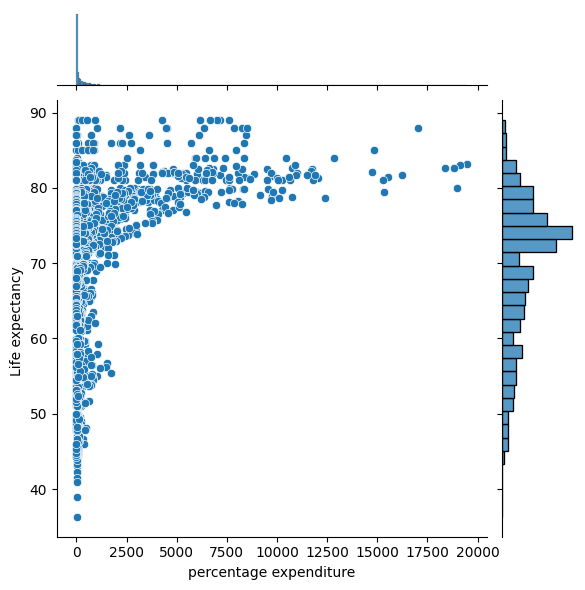

...

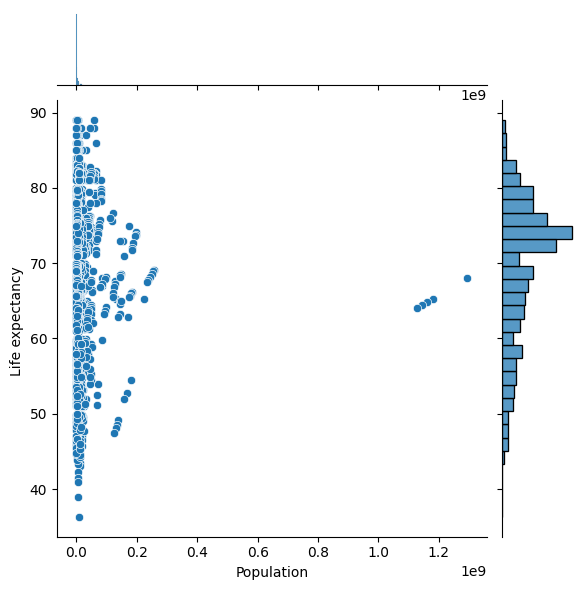

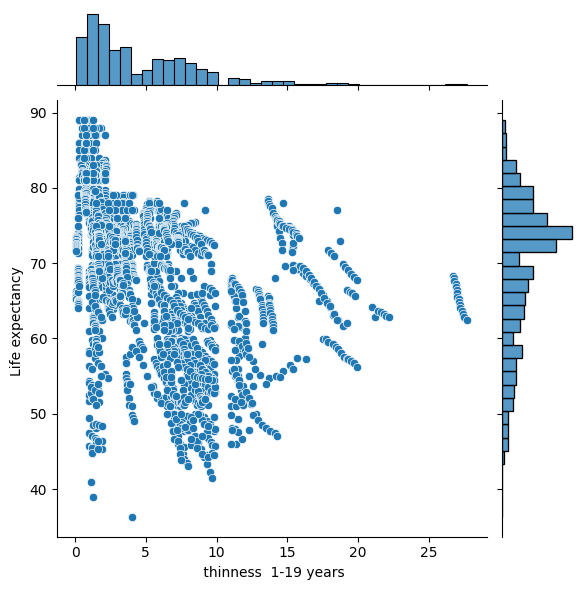

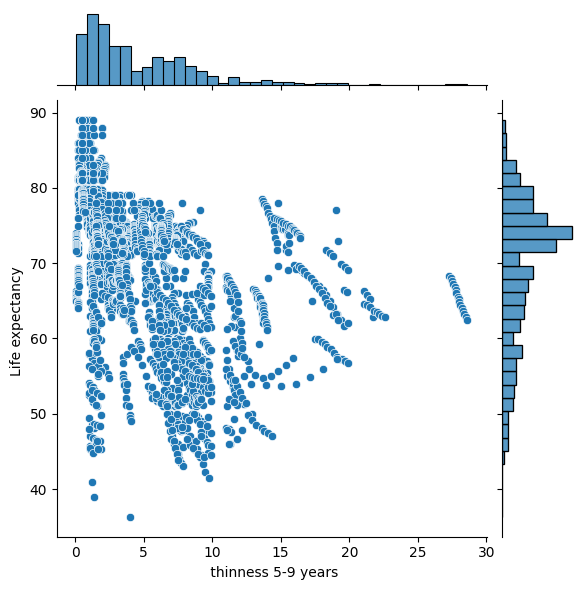

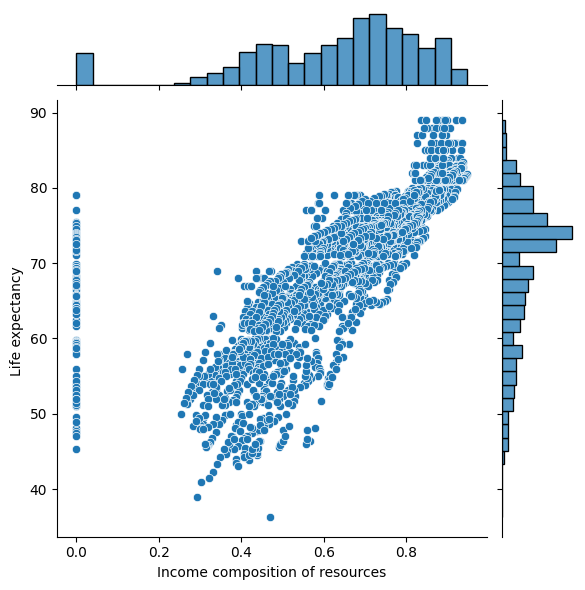

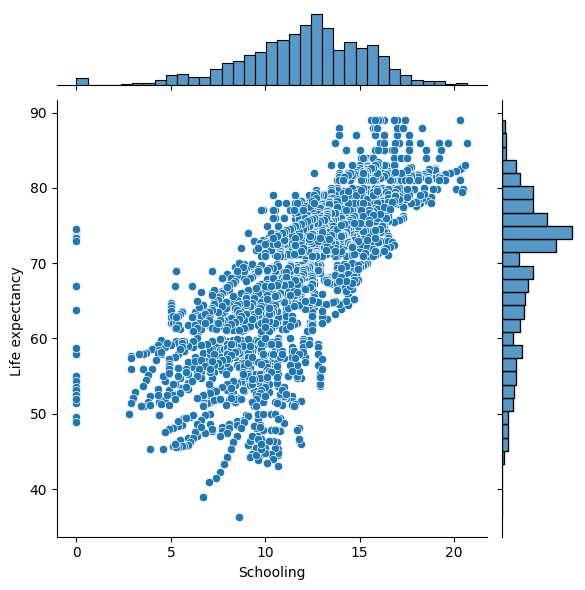

In [ ]:
# jointplot plot to understand relation between the data

for i in ['Year', 'Adult Mortality', 'infant deaths',
       'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles ', ' BMI ',
       'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ',
       ' HIV/AIDS', 'GDP', 'Population', ' thinness  1-19 years',
       ' thinness 5-9 years', 'Income composition of resources', 'Schooling']:
       sns.jointplot(data= life_expectancy, x=i , y="Life expectancy ")
       plt.show()

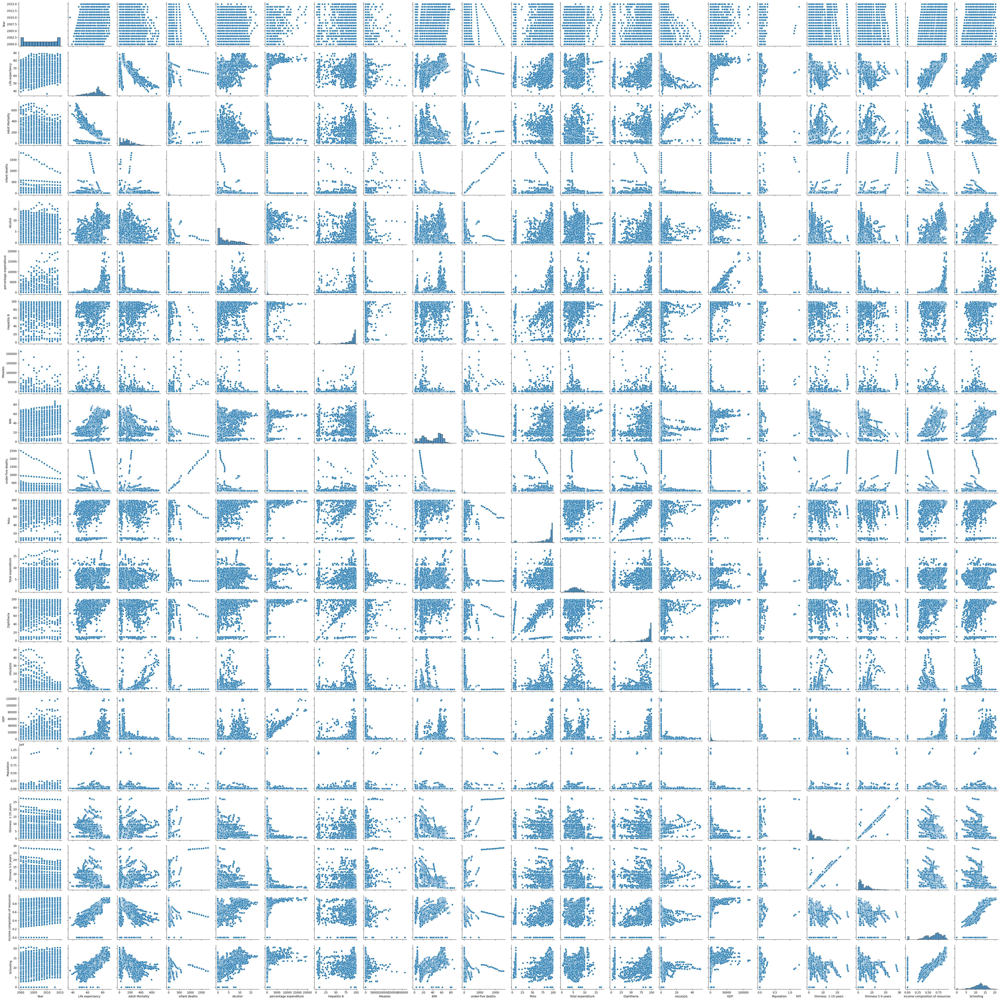

In [ ]:
sns.pairplot(life_expectancy)
# plt.show()

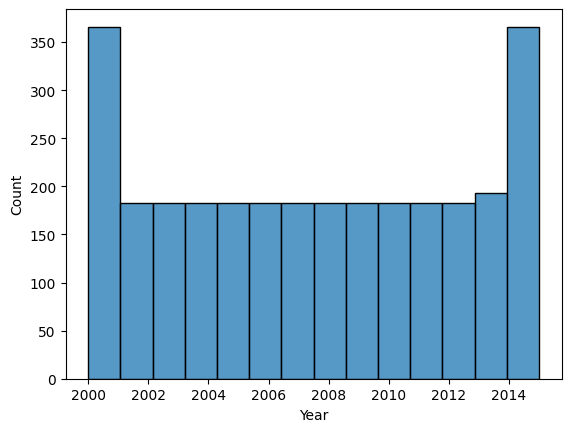

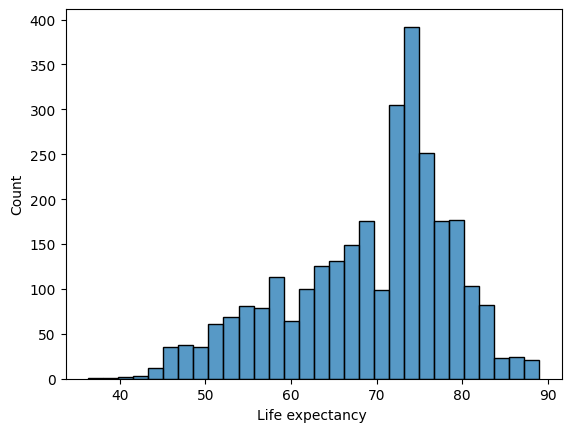

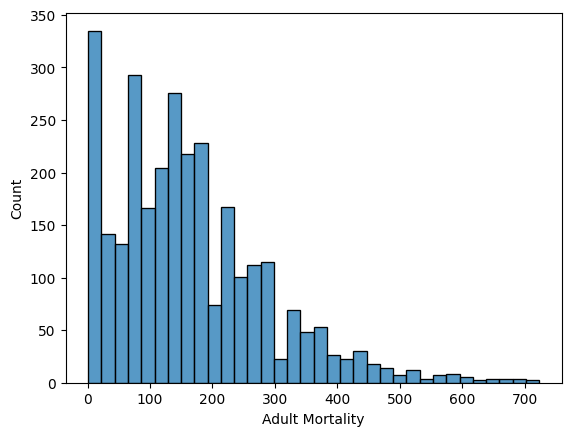

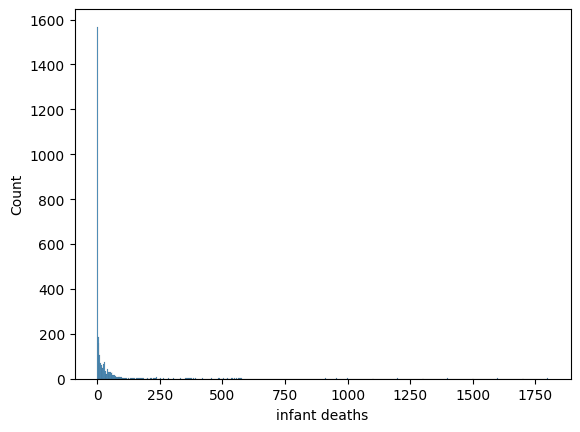

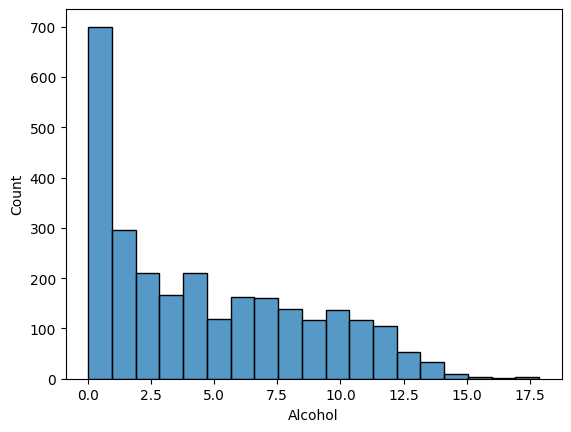

...

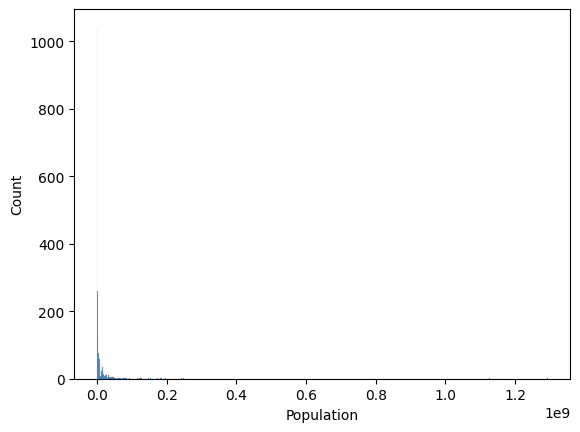

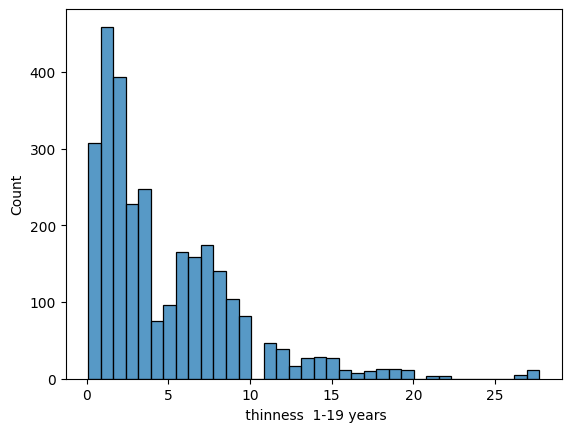

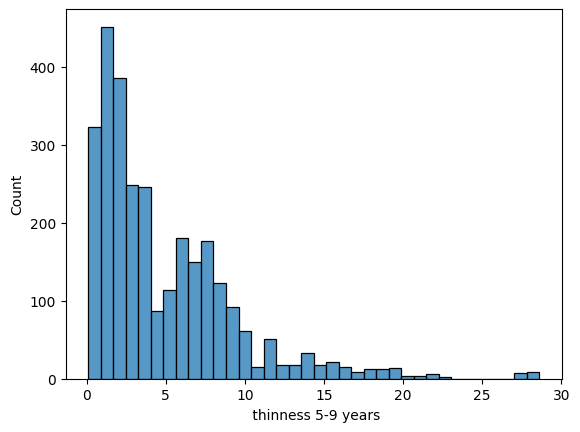

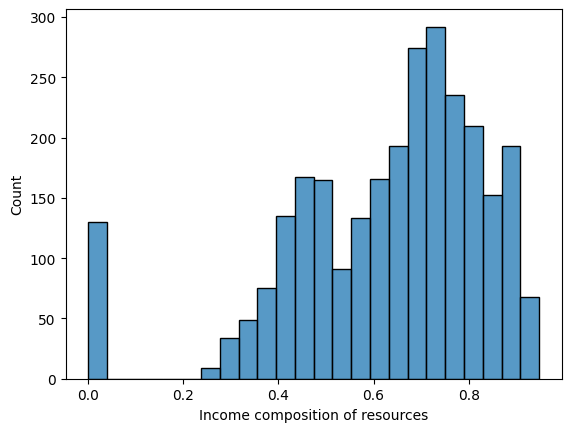

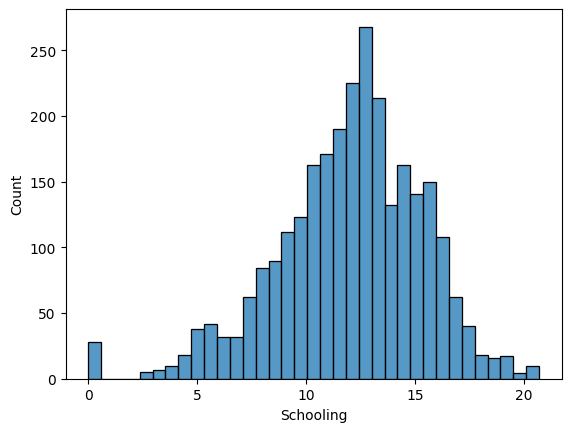

In [ ]:
#histogram to understand the distribution
for i in life_expectancy.select_dtypes(include="number").columns:
  sns.histplot(data=life_expectancy, x=i)
  plt.show()

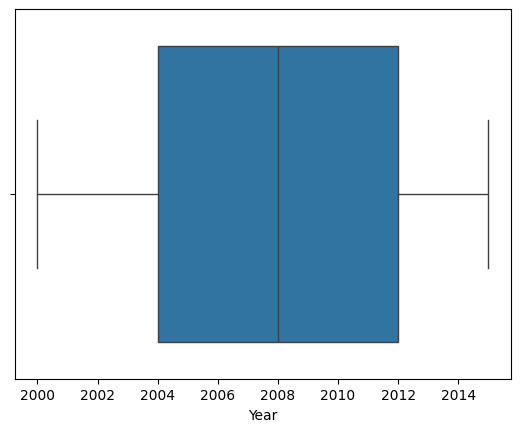

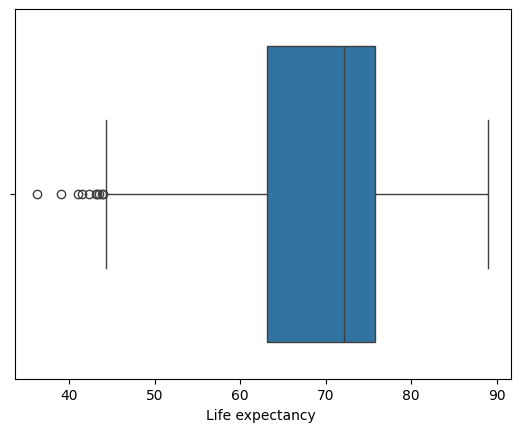

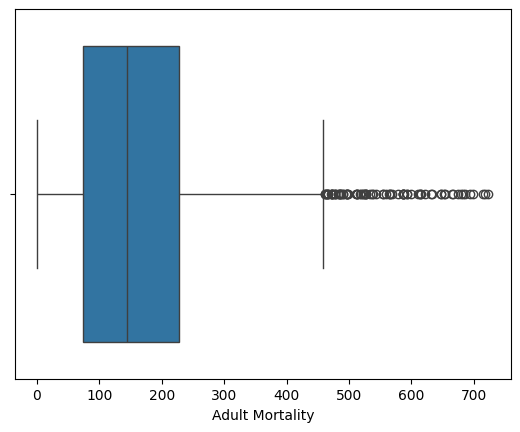

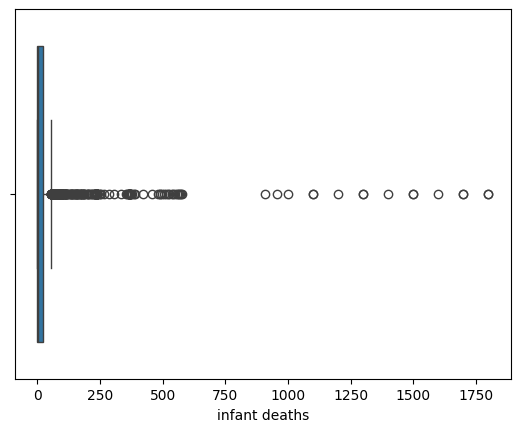

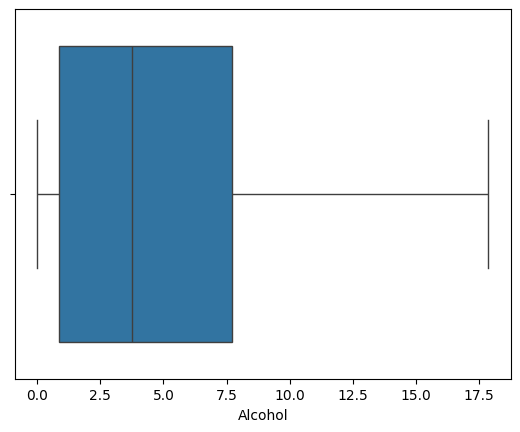

...

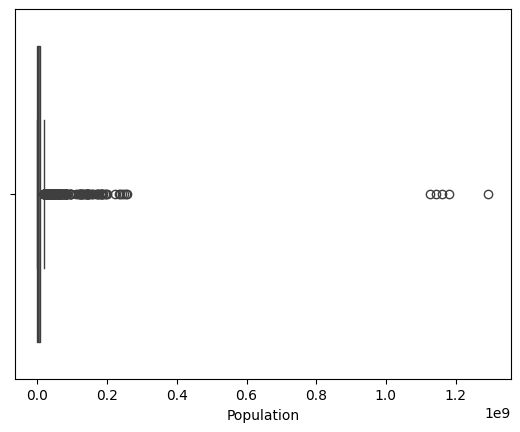

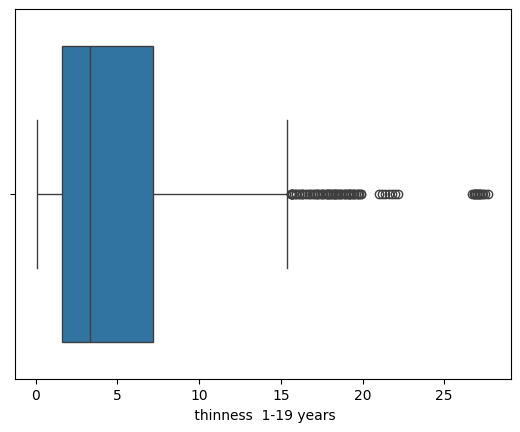

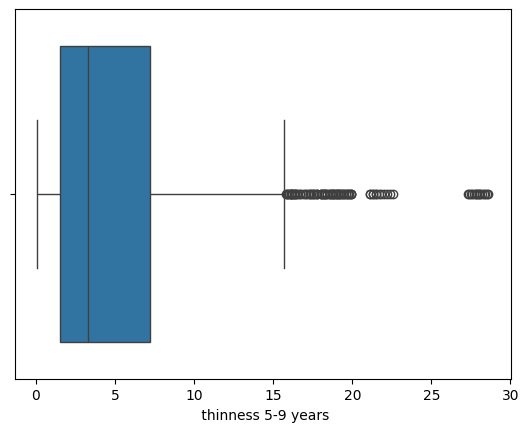

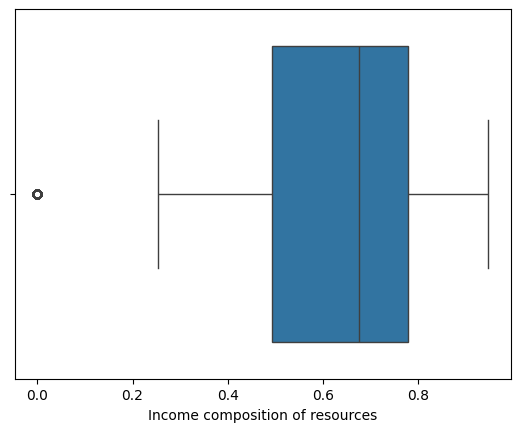

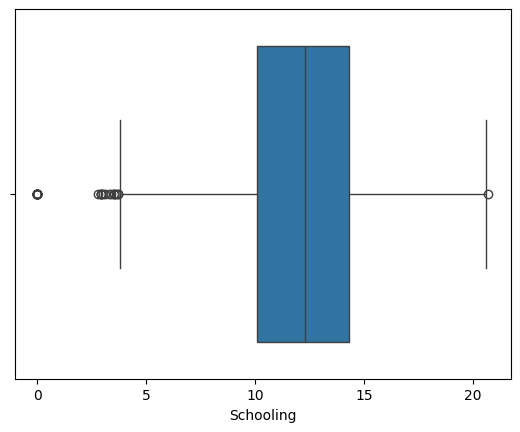

In [ ]:
#boxplot to identify outliers
for i in life_expectancy.select_dtypes(include="number").columns:
  sns.boxplot(data=life_expectancy, x=i)
  plt.show()

In [ ]:
# life_expectancy.select_dtypes(include="number").columns

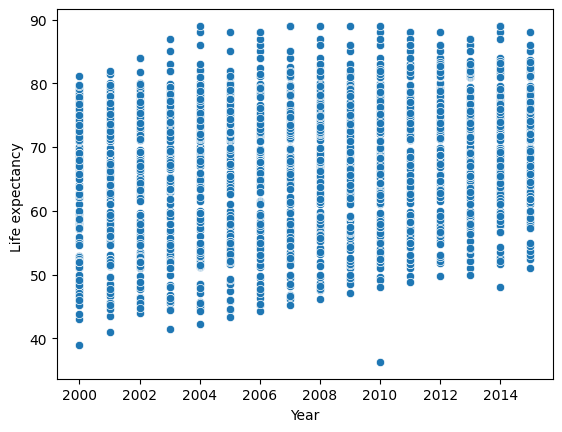

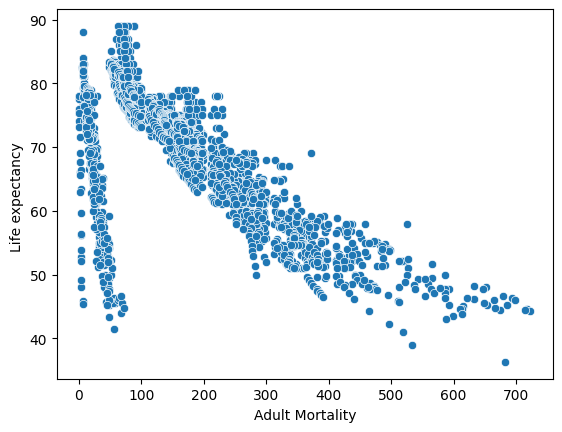

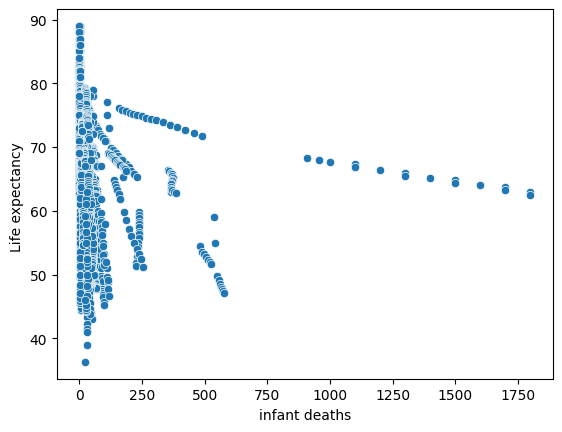

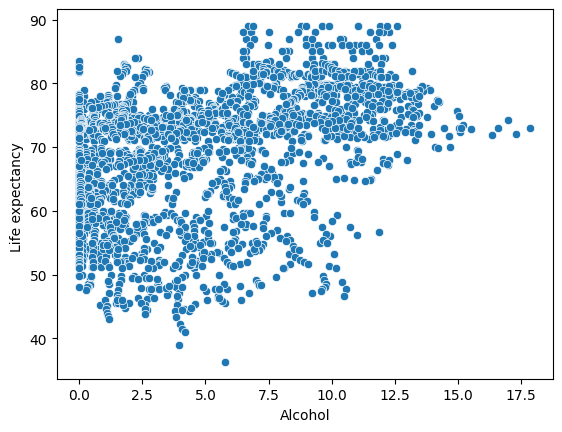

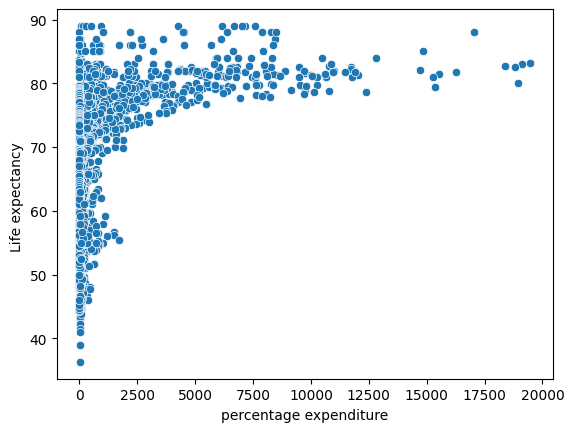

...

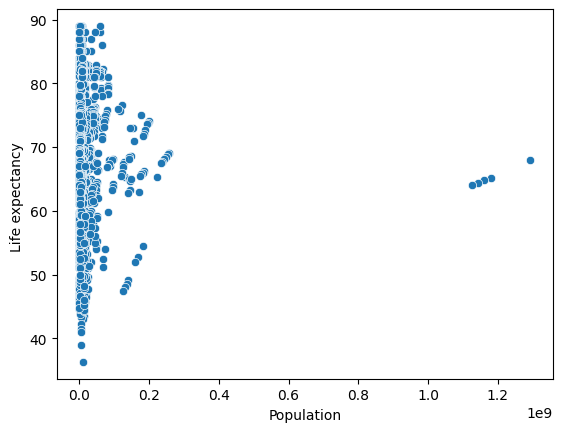

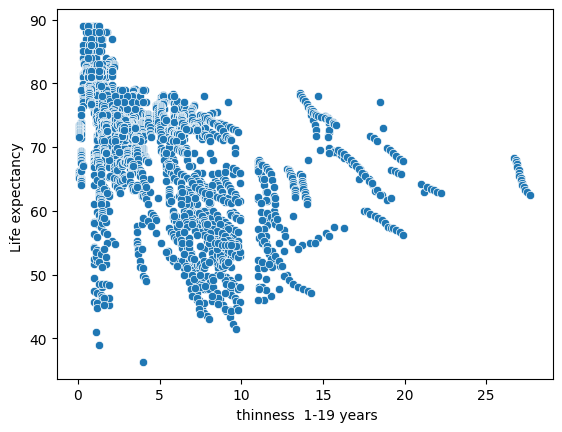

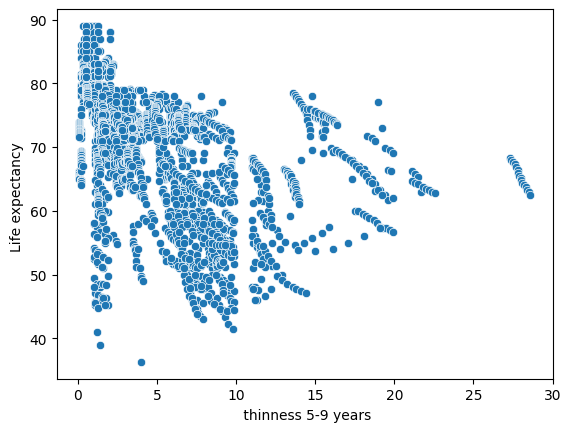

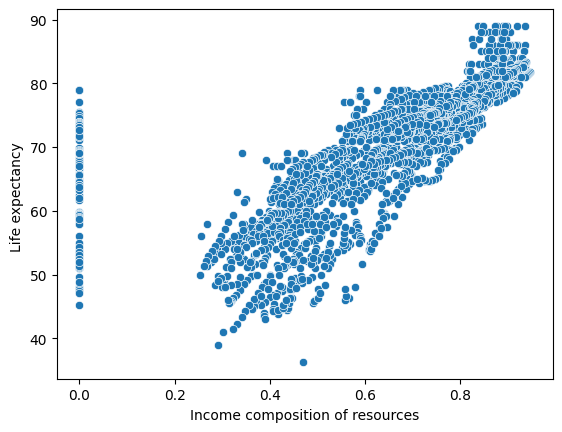

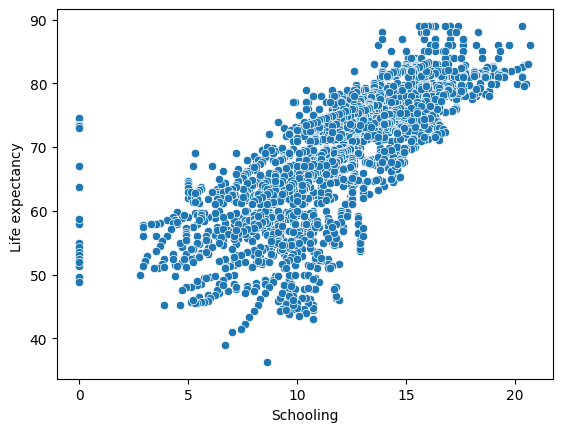

In [ ]:
# scatter plot to understand relation between the data

for i in ['Year', 'Adult Mortality', 'infant deaths',
       'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles ', ' BMI ',
       'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ',
       ' HIV/AIDS', 'GDP', 'Population', ' thinness  1-19 years',
       ' thinness 5-9 years', 'Income composition of resources', 'Schooling']:
       sns.scatterplot(data= life_expectancy, x=i , y="Life expectancy ")
       plt.show()

* upper .50 shows strong correlation.
* below .50 shows some correlation.
* if correlation above .50 is more, the model will be better.

In [ ]:
#correlation with heatmap to interpret the relation and multicolliniarity
life_expectancy.select_dtypes(include="number").corr()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Year,1.000000,0.170033,-0.079052,-0.037415,-0.052990,0.031400,0.104333,-0.082493,0.108974,-0.042937,0.094158,0.090740,0.134337,-0.139741,0.101620,0.016969,-0.047876,-0.050929,0.243468,0.209400
Life expectancy,0.170033,1.000000,-0.696359,-0.196557,0.404877,0.381864,0.256762,-0.157586,0.567694,-0.222529,0.465556,0.218086,0.479495,-0.556556,0.461455,-0.021538,-0.477183,-0.471584,0.724776,0.751975
Adult Mortality,-0.079052,-0.696359,1.000000,0.078756,-0.195848,-0.242860,-0.162476,0.031176,-0.387017,0.094146,-0.274823,-0.115281,-0.275131,0.523821,-0.296049,-0.013647,0.302904,0.308457,-0.457626,-0.454612
infant deaths,-0.037415,-0.196557,0.078756,1.000000,-0.115638,-0.085612,-0.223566,0.501128,-0.227279,0.996629,-0.170689,-0.128616,-0.175171,0.025231,-0.108427,0.556801,0.465711,0.471350,-0.145139,-0.193720
Alcohol,-0.052990,0.404877,-0.195848,-0.115638,1.000000,0.341285,0.087549,-0.051827,0.330408,-0.112370,0.221734,0.296942,0.222020,-0.048845,0.354712,-0.035252,-0.428795,-0.417414,0.450040,0.547378
percentage expenditure,0.031400,0.381864,-0.242860,-0.085612,0.341285,1.000000,0.016274,-0.056596,0.228700,-0.087852,0.147259,0.174420,0.143624,-0.097857,0.899373,-0.025662,-0.251369,-0.252905,0.381952,0.389687
Hepatitis B,0.104333,0.256762,-0.162476,-0.223566,0.087549,0.016274,1.000000,-0.120529,0.150380,-0.233126,0.486171,0.058280,0.611495,-0.112675,0.083903,-0.123321,-0.120429,-0.124960,0.199549,0.231117
Measles,-0.082493,-0.157586,0.031176,0.501128,-0.051827,-0.056596,-0.120529,1.000000,-0.175977,0.507809,-0.136166,-0.106241,-0.141882,0.030899,-0.076466,0.265966,0.224808,0.221072,-0.129568,-0.137225
BMI,0.108974,0.567694,-0.387017,-0.227279,0.330408,0.228700,0.150380,-0.175977,1.000000,-0.237669,0.284569,0.242503,0.283147,-0.243717,0.301557,-0.072301,-0.532025,-0.538911,0.508774,0.546961
under-five deaths,-0.042937,-0.222529,0.094146,0.996629,-0.112370,-0.087852,-0.233126,0.507809,-0.237669,1.000000,-0.188720,-0.130148,-0.195668,0.038062,-0.112081,0.544423,0.467789,0.472263,-0.163305,-0.209373


<Axes: >

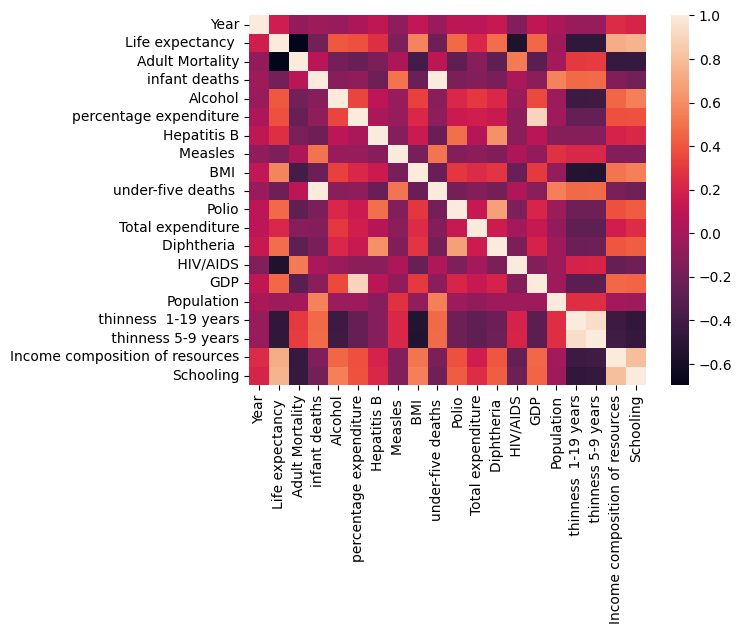

In [ ]:
sns.heatmap(life_expectancy.select_dtypes(include="number").corr())

<Axes: >

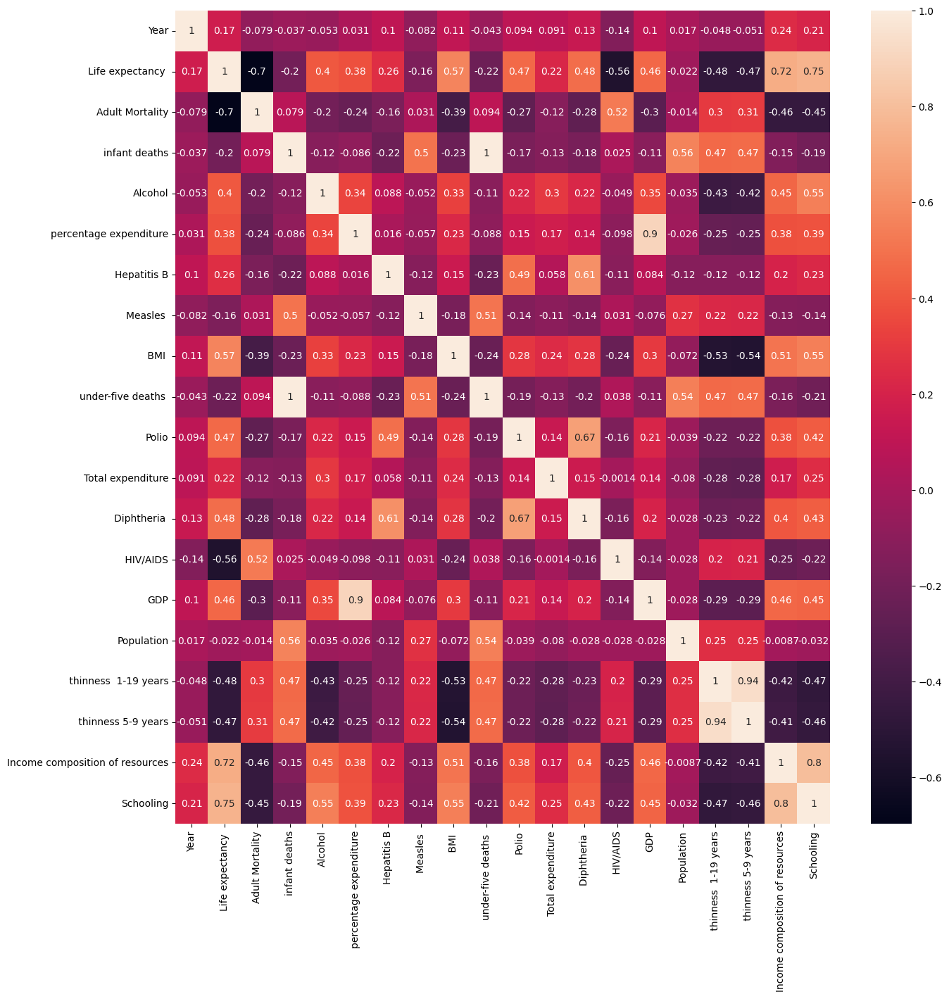

In [ ]:
plt.figure(figsize=(15,15))
sns.heatmap(life_expectancy.select_dtypes(include="number").corr(), annot=True)

###Missing value Treatment

In [ ]:
from sklearn.impute import KNNImputer
impute=KNNImputer()

for i in life_expectancy.select_dtypes(include="number").columns:
  life_expectancy[i]=impute.fit_transform(life_expectancy[[i]])

In [ ]:
life_expectancy.isnull().sum()

,0
Country,0
Year,0
Status,0
Life expectancy,0
Adult Mortality,0
infant deaths,0
Alcohol,0
percentage expenditure,0
Hepatitis B,0
Measles,0


###Outlier treatment

In [ ]:
def wisker(col):
    q1,q3=np.percentile(col,[25,75])
    iqr=q3-q1
    lower_wisker=q1-(1.5*iqr)
    upper_wisker=q3+(1.5*iqr)
    return lower_wisker,upper_wisker

In [ ]:
#checking if the function is working or not
wisker(life_expectancy["GDP"])

(-9773.52021495771, 17837.165679596183)

In [ ]:
life_expectancy.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [ ]:
for i in ["GDP", "Total expenditure", " thinness  1-19 years", " thinness 5-9 years", 'Income composition of resources', 'Schooling']:
    lower_wisker,upper_wisker=wisker(life_expectancy[i])
    life_expectancy[i]=np.where(life_expectancy[i]>upper_wisker,upper_wisker,life_expectancy[i])
    life_expectancy[i]=np.where(life_expectancy[i]<lower_wisker,lower_wisker,life_expectancy[i])

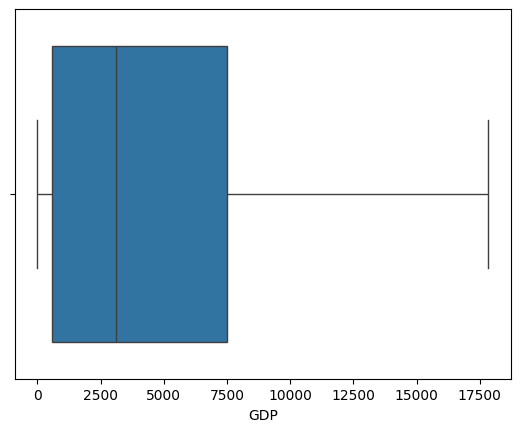

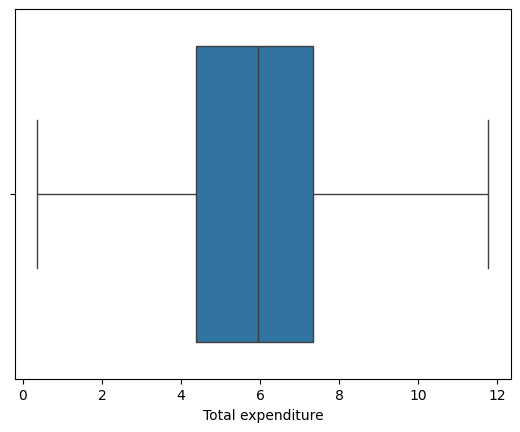

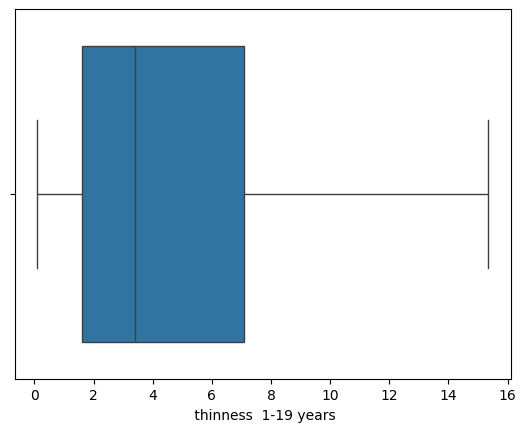

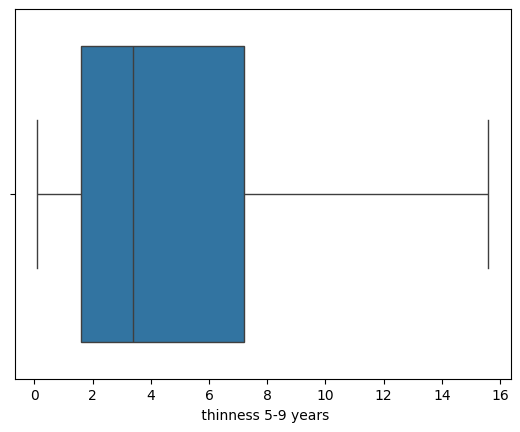

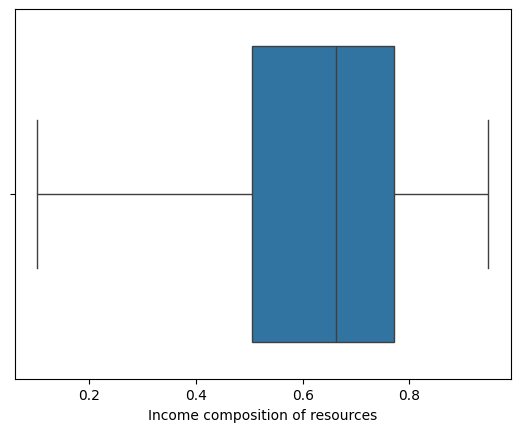

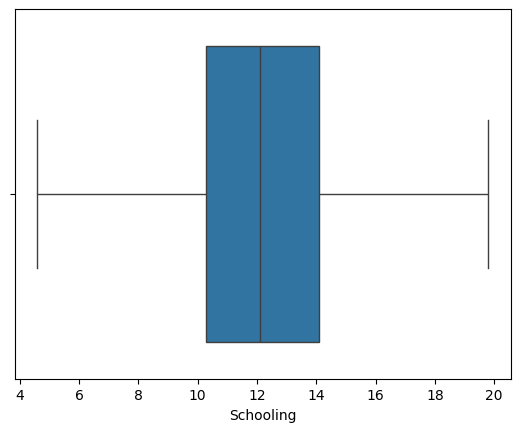

In [ ]:
#boxplot to compare after outlier treatment
for i in  ["GDP", "Total expenditure", " thinness  1-19 years", " thinness 5-9 years", 'Income composition of resources', 'Schooling']:
  sns.boxplot(data=life_expectancy, x=i)
  plt.show()

### Duplicate and garbage value treatment

In [ ]:
#no duplicates

###Feature engineering (Encoding of Data)

In [ ]:
#do label encoding and one hot encoding with pd.getdummies

In [ ]:
life_expectancy["Country"].unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina',
       'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', "Côte d'Ivoire", 'Cabo Verde',
       'Cambodia', 'Cameroon', 'Canada', 'Central African Republic',
       'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo',
       'Cook Islands', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus',
       'Czechia', "Democratic People's Republic of Korea",
       'Democratic Republic of the Congo', 'Denmark', 'Djibouti',
       'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon', 'Gambia',
       'Georgia', 'Germany'

In [ ]:
life_expectancy["Status"].unique()

array(['Developing', 'Developed'], dtype=object)

In [ ]:
# # droping country
# to_drop = 'Country'

# # Drop that column from the DataFrame
# life_expectancy = life_expectancy.drop(to_drop, axis=1)

In [ ]:
# # necessary imports
# !pip install category_encoders
# import category_encoders as ce

# # Initialize the binary encoder
# encoder = ce.BinaryEncoder(cols=['Country'])

# # Fit and transform the data
# encoded_life_expectancy = encoder.fit_transform(life_expectancy)

# # Print the encoded data
# print(encoded_life_expectancy)


In [ ]:
# from sklearn.preprocessing import LabelEncoder

# # Initialize the label encoder
# label_encoder = LabelEncoder()

# # Fit and transform the "country" column
# life_expectancy['Country'] = label_encoder.fit_transform(life_expectancy['Country'])

# # Display the results
# print(life_expectancy)


In [ ]:
encoded_life_expectancy = pd.get_dummies(data=life_expectancy, columns=["Country","Status"], drop_first=True)
encoded_life_expectancy

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,...,Country_United States of America,Country_Uruguay,Country_Uzbekistan,Country_Vanuatu,Country_Venezuela (Bolivarian Republic of),Country_Viet Nam,Country_Yemen,Country_Zambia,Country_Zimbabwe,Status_Developing
0,2015.0,65.0,263.0,62.0,0.01,71.279624,65.0,1154.0,19.1,83.0,...,False,False,False,False,False,False,False,False,False,True
1,2014.0,59.9,271.0,64.0,0.01,73.523582,62.0,492.0,18.6,86.0,...,False,False,False,False,False,False,False,False,False,True
2,2013.0,59.9,268.0,66.0,0.01,73.219243,64.0,430.0,18.1,89.0,...,False,False,False,False,False,False,False,False,False,True
3,2012.0,59.5,272.0,69.0,0.01,78.184215,67.0,2787.0,17.6,93.0,...,False,False,False,False,False,False,False,False,False,True
4,2011.0,59.2,275.0,71.0,0.01,7.097109,68.0,3013.0,17.2,97.0,...,False,False,False,False,False,False,False,False,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2004.0,44.3,723.0,27.0,4.36,0.000000,68.0,31.0,27.1,42.0,...,False,False,False,False,False,False,False,False,True,True
2934,2003.0,44.5,715.0,26.0,4.06,0.000000,7.0,998.0,26.7,41.0,...,False,False,False,False,False,False,False,False,True,True
2935,2002.0,44.8,73.0,25.0,4.43,0.000000,73.0,304.0,26.3,40.0,...,False,False,False,False,False,False,False,False,True,True
2936,2001.0,45.3,686.0,25.0,1.72,0.000000,76.0,529.0,25.9,39.0,...,False,False,False,False,False,False,False,False,True,True


###Feature Scaling (Standardizing Data)

In [ ]:
from sklearn.model_selection import train_test_split

X=encoded_life_expectancy.drop("Life expectancy ", axis=1)
y=encoded_life_expectancy["Life expectancy "]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(2056, 212)
(882, 212)
(2056,)
(882,)


<Axes: >

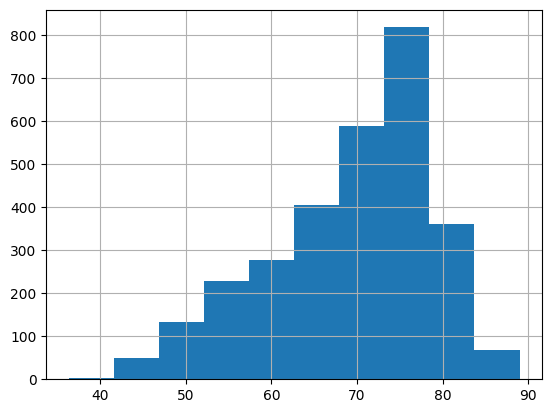

In [ ]:
life_expectancy["Life expectancy "].hist()

not normally disctributed. so we need to use minmaxscaler

In [ ]:
print("per-feature minimum before scaling:\n {}".format(X_train.min(axis=0)))
print("per-feature maximum before scaling:\n {}".format(X_train.max(axis=0)))

per-feature minimum before scaling:
 Year                      2000.0
Adult Mortality              1.0
infant deaths                0.0
Alcohol                     0.01
percentage expenditure       0.0
                           ...  
Country_Viet Nam           False
Country_Yemen              False
Country_Zambia             False
Country_Zimbabwe           False
Status_Developing          False
Length: 212, dtype: object
per-feature maximum before scaling:
 Year                           2015.0
Adult Mortality                 723.0
infant deaths                  1800.0
Alcohol                         17.31
percentage expenditure    19099.04506
                             ...     
Country_Viet Nam                 True
Country_Yemen                    True
Country_Zambia                   True
Country_Zimbabwe                 True
Status_Developing                True
Length: 212, dtype: object


In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler=MinMaxScaler()

X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)


In [ ]:
print("per-feature minimum after scaling:\n {}".format(
    X_train_scaled.min(axis=0)))
print("per-feature maximum after scaling:\n {}".format(
    X_train_scaled.max(axis=0)))

per-feature minimum after scaling:
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
per-feature maximum after scaling:
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.

###Feature selection

In [ ]:
le_corr=encoded_life_expectancy.select_dtypes(include="number").corr()
le_corr

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Year,1.000000,0.169623,-0.078861,-0.037415,-0.048168,0.031400,0.089398,-0.082493,0.108327,-0.042937,0.093820,0.080874,0.133853,-0.139741,0.104351,0.014951,-0.049048,-0.049470,0.229349,0.199153
Life expectancy,0.169623,1.000000,-0.696359,-0.196535,0.391598,0.381791,0.203771,-0.157574,0.559255,-0.222503,0.461574,0.211688,0.475418,-0.556457,0.497838,-0.019638,-0.511941,-0.509252,0.728670,0.738162
Adult Mortality,-0.078861,-0.696359,1.000000,0.078747,-0.190408,-0.242814,-0.138591,0.031174,-0.381449,0.094135,-0.272694,-0.109178,-0.273014,0.523727,-0.312445,-0.012501,0.335430,0.342744,-0.464936,-0.445526
infant deaths,-0.037415,-0.196535,0.078747,1.000000,-0.113812,-0.085612,-0.178783,0.501128,-0.227220,0.996629,-0.170674,-0.131147,-0.175156,0.025231,-0.145977,0.548522,0.316137,0.317831,-0.154384,-0.203574
Alcohol,-0.048168,0.391598,-0.190408,-0.113812,1.000000,0.339634,0.075447,-0.051055,0.318070,-0.110777,0.213744,0.303642,0.215242,-0.048650,0.393077,-0.030765,-0.436035,-0.426368,0.438096,0.517751
percentage expenditure,0.031400,0.381791,-0.242814,-0.085612,0.339634,1.000000,0.011679,-0.056596,0.228537,-0.087852,0.147203,0.186467,0.143570,-0.097857,0.652429,-0.024648,-0.268853,-0.272232,0.399599,0.402724
Hepatitis B,0.089398,0.203771,-0.138591,-0.178783,0.075447,0.011679,1.000000,-0.090317,0.134929,-0.184413,0.408519,0.056440,0.499958,-0.102405,0.099249,-0.109811,-0.087571,-0.091770,0.161596,0.179366
Measles,-0.082493,-0.157574,0.031174,0.501128,-0.051055,-0.056596,-0.090317,1.000000,-0.175925,0.507809,-0.136146,-0.106747,-0.141861,0.030899,-0.088785,0.236250,0.187089,0.183881,-0.118761,-0.128690
BMI,0.108327,0.559255,-0.381449,-0.227220,0.318070,0.228537,0.134929,-0.175925,1.000000,-0.237586,0.282156,0.226815,0.281059,-0.243548,0.345459,-0.063238,-0.555854,-0.564329,0.505954,0.532959
under-five deaths,-0.042937,-0.222503,0.094135,0.996629,-0.110777,-0.087852,-0.184413,0.507809,-0.237586,1.000000,-0.188703,-0.132614,-0.195651,0.038062,-0.151896,0.535864,0.324683,0.325260,-0.172575,-0.219121


<Axes: >

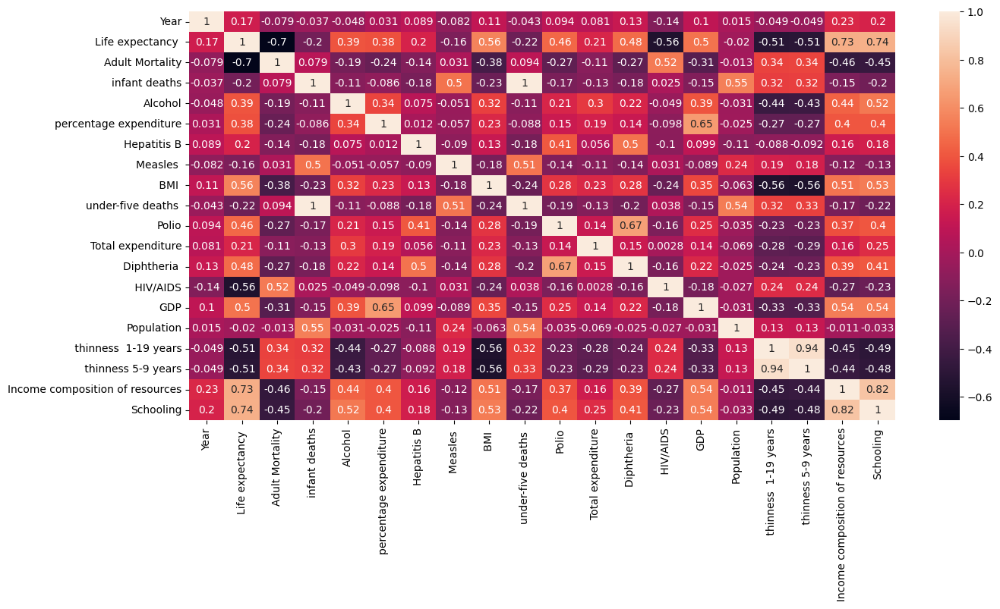

In [ ]:
import seaborn as sns
plt.figure(figsize=(15,7))
sns.heatmap(le_corr, annot=True)

In [ ]:
# Take a minute to find the column where the correlation value is greater than 0.75 at least twice
to_drop = ["under-five deaths ","percentage expenditure", " thinness 5-9 years", "Schooling"]

# Drop that column from the DataFrame
encoded_life_expectancy = encoded_life_expectancy.drop(to_drop, axis=1)

# Print out the head of the new dataset
encoded_life_expectancy.head()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,Hepatitis B,Measles,BMI,Polio,Total expenditure,...,Country_United States of America,Country_Uruguay,Country_Uzbekistan,Country_Vanuatu,Country_Venezuela (Bolivarian Republic of),Country_Viet Nam,Country_Yemen,Country_Zambia,Country_Zimbabwe,Status_Developing
0,2015.0,65.0,263.0,62.0,0.01,65.0,1154.0,19.1,6.0,8.16,...,False,False,False,False,False,False,False,False,False,True
1,2014.0,59.9,271.0,64.0,0.01,62.0,492.0,18.6,58.0,8.18,...,False,False,False,False,False,False,False,False,False,True
2,2013.0,59.9,268.0,66.0,0.01,64.0,430.0,18.1,62.0,8.13,...,False,False,False,False,False,False,False,False,False,True
3,2012.0,59.5,272.0,69.0,0.01,67.0,2787.0,17.6,67.0,8.52,...,False,False,False,False,False,False,False,False,False,True
4,2011.0,59.2,275.0,71.0,0.01,68.0,3013.0,17.2,68.0,7.87,...,False,False,False,False,False,False,False,False,False,True


<Axes: >

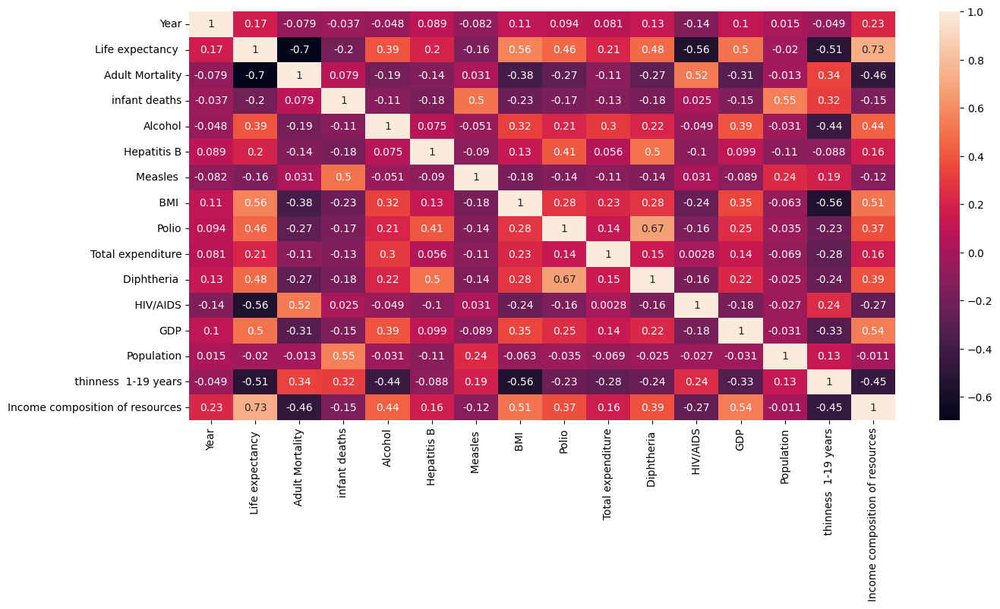

In [ ]:
le_corr=encoded_life_expectancy.select_dtypes(include="number").corr()
le_corr

import seaborn as sns
plt.figure(figsize=(15,7))
sns.heatmap(le_corr, annot=True)

#Linear Regression Model

In [ ]:
from sklearn.linear_model import LinearRegression

model= LinearRegression()
model.fit(X_train_scaled,y_train)

LinearRegression()

In [ ]:
model.coef_

array([ 3.83820117e+00, -9.64366120e-01,  1.14457999e+02, -1.29937221e+00,
        2.49441453e+00, -3.31462635e-01, -2.05743832e+00, -2.39403130e-01,
       -1.19881648e+02,  2.73409181e-01, -3.86625874e-01,  7.07281840e-01,
       -1.61122613e+01, -6.07141035e-01, -7.46769838e-01,  1.80656937e-01,
        6.09613726e-01,  6.99688782e-03,  3.75303311e+00,  1.61739528e+01,
        1.39211621e+01, -6.96584451e+00,  1.69775258e+01,  1.54938669e+01,
        1.44321988e+01,  1.47298098e+00,  2.80869212e+00,  1.16964636e+01,
        1.59105713e+01,  1.61443937e+01,  1.01257875e+01,  1.53812506e+01,
        1.11356664e+01,  2.49479306e+00,  1.06596811e+01, -6.08393827e-02,
        6.64649501e+00,  9.17626843e+00,  1.71269517e+01,  2.96894644e+00,
        1.35778801e+01,  1.65768078e+01, -5.08949278e+00, -2.14281537e-01,
       -9.30597585e-01,  1.25246914e+01,  5.92243503e+00, -1.52595242e+00,
        2.22364251e+01, -5.75586702e+00, -4.39264328e+00,  1.99029014e+01,
        1.38481052e+01,  

In [ ]:
y_pred_lr = model.predict(X_test_scaled)

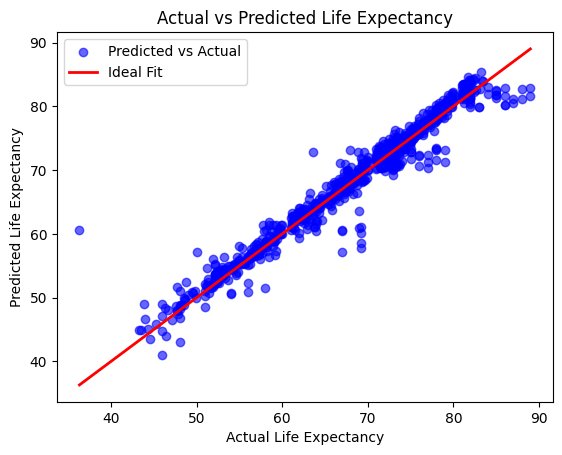

In [ ]:
plt.scatter(y_test, y_pred_lr, color='blue', alpha=0.6, label='Predicted vs Actual')
plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual Life Expectancy')
plt.ylabel('Predicted Life Expectancy')
plt.title('Actual vs Predicted Life Expectancy')
plt.legend()
plt.show()

In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score,mean_absolute_error

metrics_lr = {
    'MAE': mean_absolute_error(y_test, y_pred_lr),
    'MSE': mean_squared_error(y_test, y_pred_lr),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_lr)),
    'R-squared': r2_score(y_test, y_pred_lr)
}

for metric, value in metrics_lr.items():
    print(f'{metric} : {value}')

MAE : 1.244478595042193
MSE : 4.157572059468552
RMSE : 2.0390125206747878
R-squared : 0.9555107475290541


<ipython-input-53-56ba830193aa>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test - y_pred_lr)


<Axes: xlabel='Life expectancy ', ylabel='Density'>

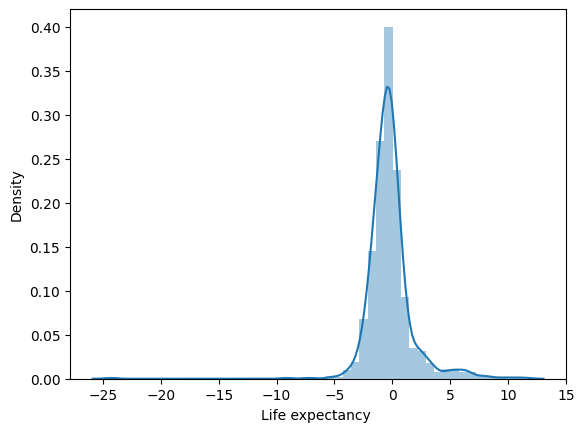

In [ ]:
# sns.distplot(y_test - predictions,bins=50)
sns.distplot(y_test - y_pred_lr)

In [ ]:
coeffecients = pd.DataFrame(model.coef_,X.columns)
coeffecients.columns = ['Coeffecient']
coeffecients

,Coeffecient
Year,3.838201
Adult Mortality,-0.964366
infant deaths,114.457999
Alcohol,-1.299372
percentage expenditure,2.494415
...,...
Country_Viet Nam,15.212573
Country_Yemen,5.520683
Country_Zambia,-0.295114
Country_Zimbabwe,-1.133478


#Decision Tree Regressor Model

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Fitting Decision Tree Regression to the dataset
from sklearn.tree import DecisionTreeRegressor

model = DecisionTreeRegressor()
model.fit(X_train_scaled,y_train)

y_pred_dt = model.predict(X_test_scaled)

In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error, r2_score,mean_absolute_error

metrics_dt = {
    'MAE': mean_absolute_error(y_test, y_pred_dt),
    'MSE': mean_squared_error(y_test, y_pred_dt),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_dt)),
    'R-squared': r2_score(y_test, y_pred_dt)
}

for metric, value in metrics_dt.items():
    print(f'{metric} : {value}')


MAE : 1.5500000000000005
MSE : 7.185183295561599
RMSE : 2.6805192212632236
R-squared : 0.9231129541198801


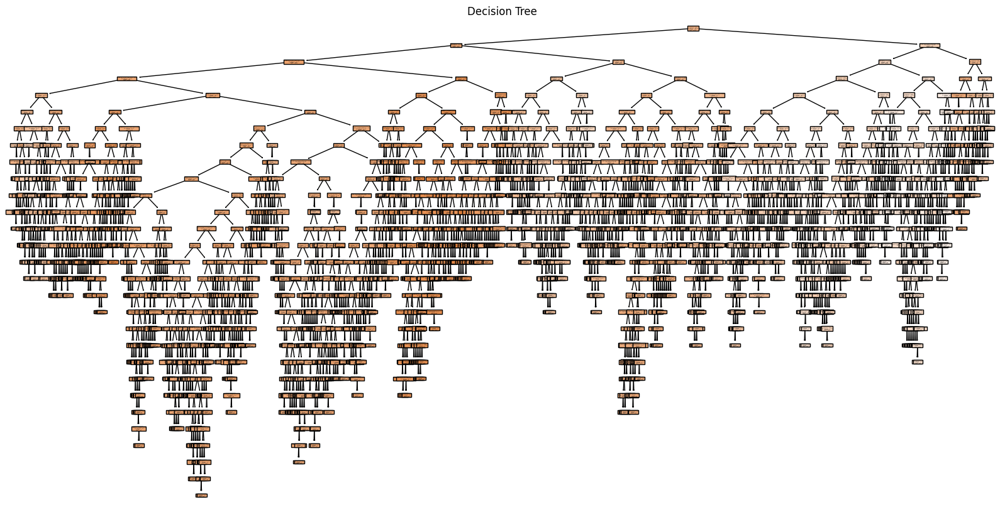

In [ ]:
# Plot the decision tree
from sklearn.tree import plot_tree
plt.figure(figsize=(20, 10))
plot_tree(model, feature_names=X.columns, filled=True)
plt.title("Decision Tree")
plt.show()

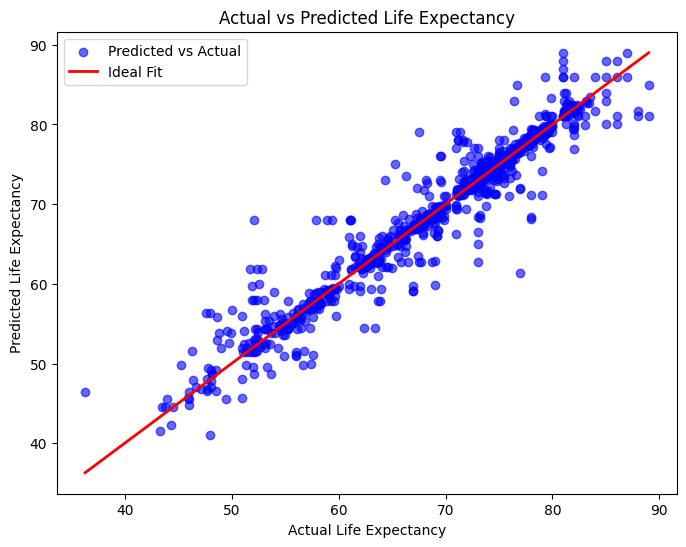

In [ ]:
# Plot predictions vs actual values
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_dt, color='blue', alpha=0.6, label='Predicted vs Actual')
plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual Life Expectancy')
plt.ylabel('Predicted Life Expectancy')
plt.title('Actual vs Predicted Life Expectancy')
plt.legend()
plt.show()

#Neural Networks

In [ ]:
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

# Build the neural network
model = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(X_train_scaled.shape[1],)),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(1, activation='relu')  # Single output for regression
])

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

# Train the model
history = model.fit(np.array(X_train_scaled) ,np.array(y_train), epochs=100, validation_split=0.2, verbose=0)

# Evaluate the model
loss, mae = model.evaluate(np.array(X_test_scaled), np.array(y_test), verbose=0)

# Predict on test set
y_pred_nn = model.predict(X_test_scaled).flatten()

metrics_nn = {
    'MAE': mae,
    'MSE': mean_squared_error(y_test, y_pred_nn),
    'RMSE': np.sqrt(mean_squared_error(y_test, y_pred_nn)),
    'R-squared': r2_score(y_test, y_pred_nn)
}

for metric, value in metrics_nn.items():
    print(f'{metric} : {value}')


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
MAE : 1.371100902557373
MSE : 5.146453259081806
RMSE : 2.2685795686027426
R-squared : 0.9449289500943779


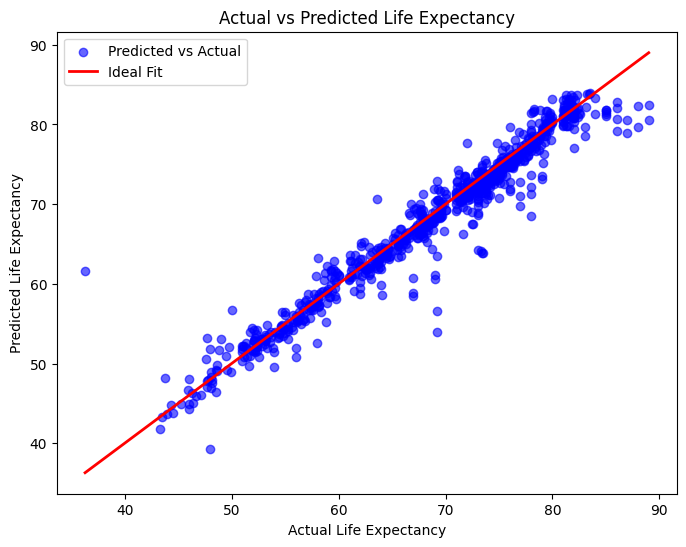

In [ ]:
# Plot actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_nn, color='blue', alpha=0.6, label='Predicted vs Actual')
plt.plot([y.min(), y.max()], [y.min(), y.max()], color='red', linewidth=2, label='Ideal Fit')
plt.xlabel('Actual Life Expectancy')
plt.ylabel('Predicted Life Expectancy')
plt.title('Actual vs Predicted Life Expectancy')
plt.legend()
plt.show()

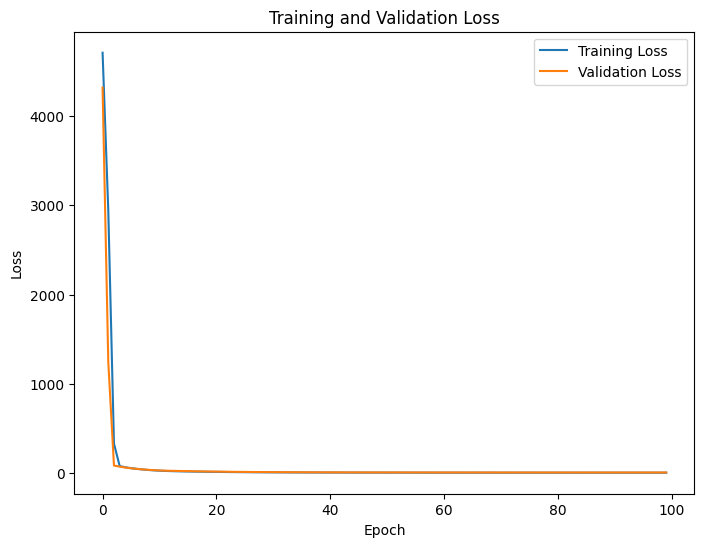

In [ ]:
# Plot training history
plt.figure(figsize=(8, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

#Comparison Analysis

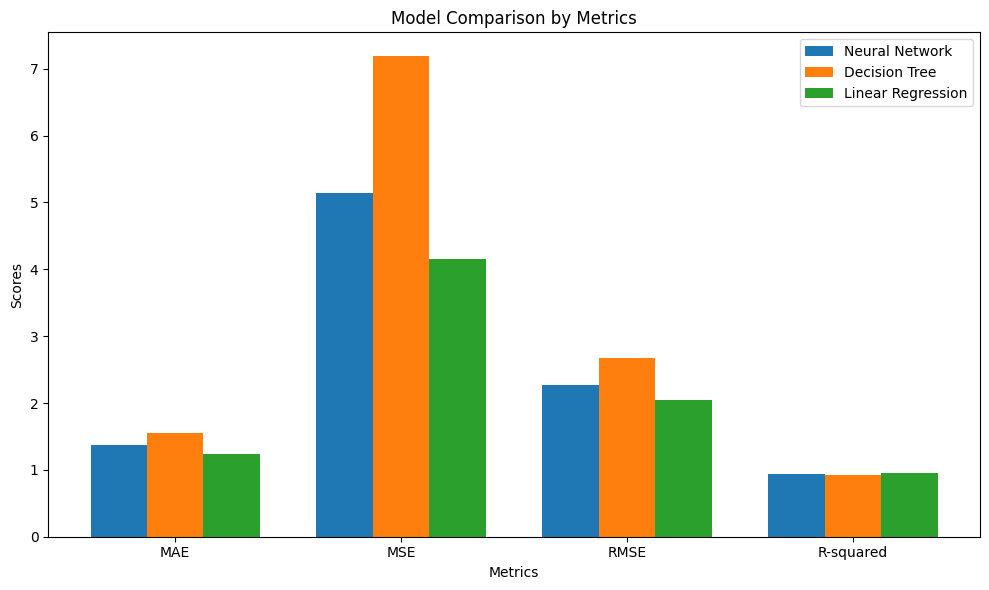

In [ ]:
metrics = ['MAE', 'MSE', 'RMSE', 'R-squared']
nn_values = list(metrics_nn.values())
dt_values = list(metrics_dt.values())
lr_values = list(metrics_lr.values())

# positions for the bars
x = np.arange(len(metrics))  # The label locations

# width of the bars
width = 0.25

fig, ax = plt.subplots(figsize=(10, 6))

# Plot the bars for each model
rects1 = ax.bar(x - width, nn_values, width, label='Neural Network')
rects2 = ax.bar(x, dt_values, width, label='Decision Tree')
rects3 = ax.bar(x + width, lr_values, width, label='Linear Regression')

# text for labels, title and custom x-axis tick labels
ax.set_xlabel('Metrics')
ax.set_ylabel('Scores')
ax.set_title('Model Comparison by Metrics')
ax.set_xticks(x)
ax.set_xticklabels(metrics)
ax.legend()

# Display the plot
plt.tight_layout()
plt.show()